In [9]:
import pandas as pd
import numpy as np
import re
import codecs

import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d, Axes3D

import folium 
from folium import plugins

from statsmodels.graphics.mosaicplot import mosaic
import matplotlib.patches as mpatches
import json
from dateutil.parser import parse
%matplotlib inline

In [10]:
m=codecs.open("zip_pass.html","r")
print(m.read())

<!DOCTYPE html>
<head>    
    <meta http-equiv="content-type" content="text/html; charset=UTF-8" />
    
        <script>
            L_NO_TOUCH = false;
            L_DISABLE_3D = false;
        </script>
    
    <script src="https://cdn.jsdelivr.net/npm/leaflet@1.5.1/dist/leaflet.js"></script>
    <script src="https://code.jquery.com/jquery-1.12.4.min.js"></script>
    <script src="https://maxcdn.bootstrapcdn.com/bootstrap/3.2.0/js/bootstrap.min.js"></script>
    <script src="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.js"></script>
    <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/leaflet@1.5.1/dist/leaflet.css"/>
    <link rel="stylesheet" href="https://maxcdn.bootstrapcdn.com/bootstrap/3.2.0/css/bootstrap.min.css"/>
    <link rel="stylesheet" href="https://maxcdn.bootstrapcdn.com/bootstrap/3.2.0/css/bootstrap-theme.min.css"/>
    <link rel="stylesheet" href="https://maxcdn.bootstrapcdn.com/font-awesome/4.6.3/css/font-a

# Data Loading

In [11]:
data = pd.read_csv("data/Food_Inspections.csv")

In [12]:
food = data.copy()

In [13]:
# Find all columns with at least one null value
null_cols=np.sum(food.isnull() , axis=0)
null_cols[null_cols>0]

AKA Name                        2451
License #                         17
Facility Type                   4776
Risk                              72
City                             138
State                             42
Zip                               50
Inspection Type                    1
Violations                     51693
Latitude                         682
Longitude                        682
Location                         682
Historical Wards 2003-2015    194904
Zip Codes                     194904
Community Areas               194904
Census Tracts                 194904
Wards                         194904
dtype: int64

In [14]:
food.shape

(194904, 22)

<BarContainer object of 22 artists>

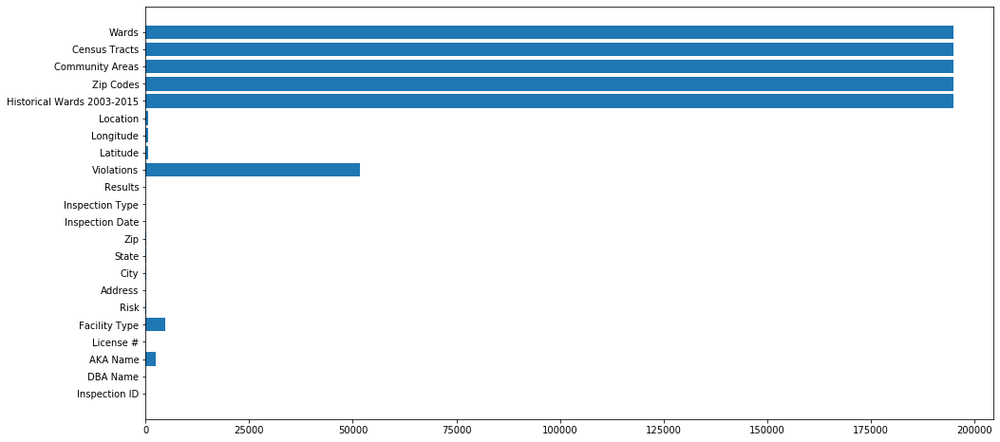

In [15]:
# Lets plot the nans
fig, ax = plt.subplots(figsize=(16,8))
ax.barh(null_cols.index, null_cols.values)

 # Data Cleaning & Munging

The columns Historical Wards 2003-2015 , Zip Codes , Community Areas , Census Tracts and Ward are all empty. So we drop them

In [16]:
food.drop(columns=["Historical Wards 2003-2015","Zip Codes", "Community Areas", "Census Tracts", "Wards"],axis=1,inplace=True)

## Results

In [17]:
results_count = food["Results"].value_counts(sort=False)
results_count

Pass w/ Conditions       26780
Out of Business          16784
Business Not Located        67
Fail                     37698
Not Ready                 1859
No Entry                  6188
Pass                    105528
Name: Results, dtype: int64

Text(0.5, 1.0, 'Repartition of the results')

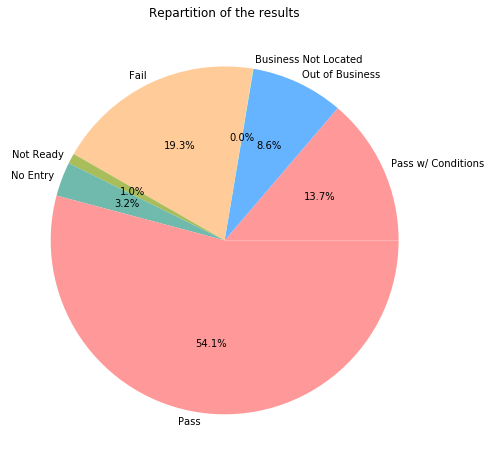

In [18]:
fig, ax = plt.subplots(figsize=(8,8))

colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99','#A9BD5A',"#6FBAaD"]

ax.pie(results_count.values,labeldistance=1.05,colors=colors, labels=results_count.index, autopct='%1.1f%%',
          startangle=0)

plt.title("Repartition of the results")

We are interested in business with inspections that pass or fail so we retain those

In [19]:
results=["Pass","Fail","Pass w/ Conditions"]
food=food[food["Results"].isin(results)]
food.shape

(170006, 17)

### Inspection Date

In [20]:
food["Inspection Date"].head()

0    10/25/2019
1    10/24/2019
2    10/24/2019
3    10/24/2019
4    10/24/2019
Name: Inspection Date, dtype: object

In [21]:
food["Inspection Date"] = food["Inspection Date"].apply(lambda d: parse(d)).copy()

In [22]:
food['Year'] = food["Inspection Date"].map(lambda x: x.year)
food['Month'] = food["Inspection Date"].map(lambda x: x.month)
food['Day'] = food["Inspection Date"].map(lambda x: x.day)

It makes sense to have the dataset in chronological order, so we sort it accordingly

In [23]:
food = food.sort_values(by="Inspection Date").copy()

In [24]:
food.head()

,Inspection ID,DBA Name,AKA Name,License #,Facility Type,Risk,Address,City,State,Zip,Inspection Date,Inspection Type,Results,Violations,Latitude,Longitude,Location,Year,Month,Day
192455,67757,DUNKIN DONUTS/BASKIN-ROBBINS,DUNKIN DONUTS/BASKIN-ROBBINS,1380279.0,Restaurant,Risk 2 (Medium),100 W RANDOLPH ST,CHICAGO,IL,60601.0,2010-01-04,Tag Removal,Pass,NaN,41.884586,-87.631010,"(-87.63101044588599, 41.88458626715456)",2010,1,4
194205,67732,WOLCOTT'S,TROQUET,1992039.0,Restaurant,Risk 1 (High),1834 W MONTROSE AVE,CHICAGO,IL,60613.0,2010-01-04,License Re-Inspection,Pass,NaN,41.961606,-87.675967,"(-87.67596676683779, 41.961605669949854)",2010,1,4
193691,67733,WOLCOTT'S,TROQUET,1992040.0,Restaurant,Risk 1 (High),1834 W MONTROSE AVE,CHICAGO,IL,60613.0,2010-01-04,License Re-Inspection,Pass,NaN,41.961606,-87.675967,"(-87.67596676683779, 41.961605669949854)",2010,1,4
194066,67738,MICHAEL'S ON MAIN CAFE,MICHAEL'S ON MAIN CAFE,2008948.0,Restaurant,Risk 1 (High),8750 W BRYN WAWR AVE,CHICAGO,IL,60631.0,2010-01-04,License,Fail,18. NO EVIDENCE OF RODENT OR INSECT OUTER OPEN...,NaN,NaN,NaN,2010,1,4
193882,70269,mr.daniel's,mr.daniel's,1899292.0,Restaurant,Risk 1 (High),5645 W BELMONT AVE,CHICAGO,IL,60634.0,2010-01-04,License Re-Inspection,Pass,NaN,41.938443,-87.768318,"(-87.76831838068422, 41.93844282365204)",2010,1,4


### Zip

Since there are only 31 cases with nan zip, we simply drop them

In [25]:
food=food[~food["Zip"].isnull()]

In [26]:
food["Zip"].value_counts().head(20).sum()/food.shape[0]

0.5342197381967937

20 Zipcodes out of 110 are where more than half of inspections take place, it's interesting to check in our further analysis whether these places are just highly dense or are they actually more prone to food inspections

### City and State

In [27]:
food[food.State.isnull() & food.City.isnull()]["Address"].unique()

array(['636 N RACINE AVE ', '500 N MILWAUKEE AVE ',
       '506 N Milwaukee AVE ', '1438 W CORTLAND ST '], dtype=object)

All Null values in State and City are in Chicago ( checked with the respective adresses)

In [28]:
food[food.State.isnull() & ~food.City.isnull()]["City"].unique()

array(['CHICAGO'], dtype=object)

Null values in State with a known city are all in Chicago

In [29]:
food[(food.City.isnull()) & (food["State"]!="IL")]["Address"].unique()

array(['636 N RACINE AVE ', '500 N MILWAUKEE AVE ',
       '506 N Milwaukee AVE ', '1438 W CORTLAND ST '], dtype=object)

All Null values in City are in Chicago ( checked with the respective adresses)

In [30]:
food["State"].fillna("IL", inplace=True)
food=food[food["State"]=="IL"]
food["City"].fillna("Chicago", inplace=True)

In [31]:
food[food["City"]!="CHICAGO"]["City"].unique()

array(['chicago', 'Chicago', 'CCHICAGO', 'CHESTNUT STREET',
       'CHICAGOCHICAGO', 'CHCICAGO', 'CHCHICAGO', 'OAK PARK', 'ALSIP',
       'EVERGREEN PARK', 'CHARLES A HAYES', 'EAST HAZEL CREST', 'MAYWOOD',
       'Maywood', 'WORTH', 'CHicago', 'BROADVIEW', 'BLUE ISLAND',
       'NAPERVILLE', 'FRANKFORT', 'GLENCOE', 'CHICAGOI', 'OAK LAWN',
       'CICERO', 'STREAMWOOD', 'OLYMPIA FIELDS', 'BERWYN', 'LAKE ZURICH',
       'DES PLAINES', 'BURNHAM', 'SUMMIT', 'BOLINGBROOK',
       'COUNTRY CLUB HILLS', 'LOMBARD', 'CHICAGO HEIGHTS', 'TINLEY PARK',
       'JUSTICE', 'OOLYMPIA FIELDS', 'ELK GROVE VILLAGE', 'EVANSTON',
       'CALUMET CITY', 'SKOKIE', 'Norridge', 'ELMHURST', 'BLOOMINGDALE',
       'SCHAUMBURG', 'BANNOCKBURNDEERFIELD', 'BEDFORD PARK', 'BRIDGEVIEW',
       'SCHILLER PARK', 'NILES NILES', '312CHICAGO', 'LAKE BLUFF',
       'CHICAGOHICAGO', 'PALOS PARK', 'PLAINFIELD', 'HIGHLAND PARK',
       'CHICAGO.', 'ROSEMONT', 'WHEATON', 'WADSWORTH', 'LANSING',
       'ALGONQUIN'], dtype=object

In [32]:
Illinois_zipcode=(60001,62999)
suburbs_zipcode=food[food["City"]!="CHICAGO"]["Zip"].unique()
# All the suburbs are within the Illinois zipcode range
all(Illinois_zipcode[0]<=city_zipcode<=Illinois_zipcode[1] for city_zipcode in suburbs_zipcode)

True

All these values are either typos for Chicago or Chicago suburbs (checked by zip code), so we keep them.

Since the columns City and State don't give us relevant information, we drop them

In [33]:
food=food.drop(columns=["City","State"])

### Location

In [34]:
# Fill the null location values with default Chicago location
default_lat=41.85003
default_long=-87.65005
default_location='(-87.65005,41.85003)'
food[food["Location"]==default_location]

,Inspection ID,DBA Name,AKA Name,License #,Facility Type,Risk,Address,Zip,Inspection Date,Inspection Type,Results,Violations,Latitude,Longitude,Location,Year,Month,Day


No other business has this location, so we can drop it when we need to plot

In [35]:
food["Latitude"].fillna(default_lat,inplace=True)
food["Longitude"].fillna(default_long,inplace=True)
food["Location"].fillna(default_location,inplace=True)

In [36]:
food_plot = food[food["Location"] != default_location]

In [37]:
m = folium.Map([41.85003, -87.65005], zoom_start=10)

sample_locaions = food_plot.sample(30000)[["Latitude", "Longitude"]].values

m.add_child(plugins.HeatMap(sample_locaions.tolist(), radius=10))
m.save("HeatMap.html")
display(m)

### License number

In [31]:
food[food["License #"].isnull()].shape

(16, 18)

In [32]:
food.groupby("License #").Location.nunique().sort_values(ascending=False).head()

License #
0.0          192
2458393.0      3
2225602.0      2
46041.0        2
2511398.0      2
Name: Location, dtype: int64

Since there are 16 nans, and we see that a lot of unidentified license are set to 0, we set them also to 0

In [33]:
food["License #"].fillna(0,inplace=True)

### Violations

As seen in the dataset describtion:

An establishment can receive one or more of 45 distinct violations (violation
numbers 1-44 and 70). For each violation number listed for a given establishment, the
requirement the establishment must meet in order for it to NOT receive a violation is
noted, followed by a specific description of the findings that caused the violation to be
issued.

For the null values in Violations, we will just replace them with "0. None reported" since the violations are numbered

In [34]:
food["Violations"].fillna("0. None Reported", inplace=True)

It's specified in the Food Inspection Reporting System (https://webapps1.chicago.gov/healthinspection/Code_Violations.jsp#1crit) 
that we can have 3 types of violation :

    -For violation number 1-14 it refers to critical violations.
    -For violation number 15-29 it refers to serious violations.
    -For the rest it refers to no critical violations,minor (30-44,70). 

For each inspection we have a list of a describtion of each violation discovered, the desciription is composed of 3 elements:
   
    -The violation number
    -The violation title
    -Comments

Therefore we parse the descriptions to separate the 3 entities.

In [142]:
def violation_parsing(food):
    """
    This function iterates over the Violations columns in the original dataset and returns three seperate columns:
    Violation number, title and comments
    Also, it returns a new dataframe where all seperate violations tuples have unique rows
    """
    # Initiating the 3 columns
    violation_number = []
    violation_title = []
    violation_comment = []
    # Initiating the exploded dataframe with 4 columns : ids, number , title and comments
    number_exploded = []
    ids_exploded = []
    title_exploded = []
    comment_exploded = []
    
    # iterating over the original dataset
    for index,row in food.iterrows():
        # spliting seperate violations
        list_violation= row['Violations'].split(' | ')
        numbers = []
        titles = []
        comments = []
        for vl in list_violation:
            
            ids_exploded.append(row['Inspection ID'])
            
            # splitting the title from the comments
            comment_splited = vl.split('- Comments:')
            
            # splitting the number from the title
            split_point = comment_splited[0].split('.')
            
            # appending the number
            numbers.append(split_point[0])
            number_exploded.append(split_point[0])
            
            #appending the title
            titles.append(split_point[1].strip())
            title_exploded.append(split_point[1].strip())
            
            # checking whether a comment exists and then appending it, otherwise we append an empty comment
            if(len(comment_splited) <= 1):
                comments.append("")
                comment_exploded.append("")
            else:
                comments.append(comment_splited[1].strip())
                comment_exploded.append(comment_splited[1].strip())
            
        violation_number.append(numbers)
        violation_title.append(titles)
        violation_comment.append(comments)
        
    # we create the exploded dataframe  
    df = pd.DataFrame({"ids": ids_exploded ,"numbers" : number_exploded , "titles" : title_exploded, "comments" : comment_exploded})
    return violation_number, violation_title, violation_comment,df

In [36]:
food ['Violation numbers'], food ['Violation title'], food ['Violation comments'], violation_exploded = violation_parsing(food)
violation_exploded.head()

,ids,numbers,titles,comments
0,67757,0,None Reported,
1,67732,0,None Reported,
2,67733,0,None Reported,
3,67738,18,NO EVIDENCE OF RODENT OR INSECT OUTER OPENINGS...,must provide pest control log book.
4,67738,32,FOOD AND NON-FOOD CONTACT SURFACES PROPERLY DE...,Pastry door not in good repair. must repair


In [37]:
# showing all different violation codes
count_violation = violation_exploded.groupby(['numbers']).comments.count()
count_violation.index = count_violation.index.map(lambda x: int(x))
count_violation = count_violation.sort_index()
count_violation.index

Int64Index([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
            17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
            34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
            51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 70],
           dtype='int64', name='numbers')

We are surprised to find violation number that are abover 44 ! This is really weird as it was not specified in the Food Inspection Reporting System.

In [38]:
# showing their respective titles
weird_cases = violation_exploded[(violation_exploded['numbers'].astype(int) > 44) & (violation_exploded['numbers'] != "70") ]

weird_cases.groupby(['numbers']).titles.value_counts()

numbers  titles                                                                           
45       FOOD HANDLER REQUIREMENTS MET                                                         7475
         SINGLE-USE/SINGLE-SERVICE ARTICLES: PROPERLY STORED & USED                             415
46       GLOVES USED PROPERLY                                                                    76
47       FOOD & NON-FOOD CONTACT SURFACES CLEANABLE, PROPERLY DESIGNED, CONSTRUCTED & USED     6514
48       WAREWASHING FACILITIES: INSTALLED, MAINTAINED & USED; TEST STRIPS                     1669
49       NON-FOOD/FOOD CONTACT SURFACES CLEAN                                                  4649
50       HOT & COLD WATER AVAILABLE; ADEQUATE PRESSURE                                          281
51       PLUMBING INSTALLED; PROPER BACKFLOW DEVICES                                           5526
52       SEWAGE & WASTE WATER PROPERLY DISPOSED                                                 374
53       

In [39]:
colors = ["Purple"] + ["red"] * 14 + ["orange"] * 15 + ["yellow"] *15 + ["green"] *19 + ["yellow"]
df_count = pd.DataFrame({'number' : count_violation.index, 'count' :  count_violation.values, 'color' : colors} )

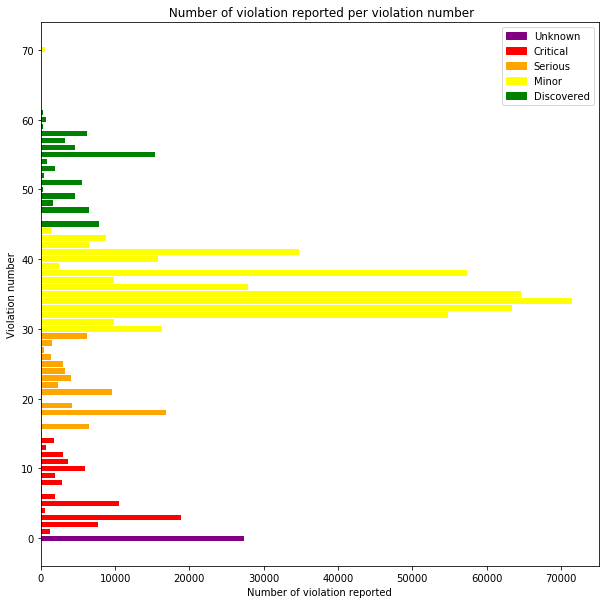

In [40]:
# plotting violations frequencies
fig, ax = plt.subplots(figsize=(10,10))
ax.barh(df_count['number'] ,df_count['count'], color = df_count['color'])

UK = mpatches.Patch(color='purple', label='Unknown')
CR = mpatches.Patch(color='red', label='Critical')
SR = mpatches.Patch(color='orange', label='Serious')
MI = mpatches.Patch(color='yellow', label='Minor')
DS = mpatches.Patch(color='green', label='Discovered')
plt.legend(handles=[UK,CR,SR,MI,DS], loc=1)
plt.xlabel("Number of violation reported")
plt.ylabel("Violation number")
plt.title(" Number of violation reported per violation number")
plt.show()

For each inspection we consider a score that counts the number of violations per type of violation (minor,serious,critical). 

The new violation numbers (44-63) are grouped with the minor violations.

In [41]:
def score(numbers):
    """ This function creates a score for the violation according to its category (minor,serious,critical)
    and returns the score as a tuple
    """
    minor = 0
    serious = 0
    critical = 0
    for number in numbers:
        number = int(number)
        if( (number >=1) & (number <=14) ):
            critical+=1
        elif ((number >=15) and (number <=29) ) :
            serious+=1
        elif (number >29) :  
            minor+=1
    return minor,serious,critical

food['Violation score minor']    = food ['Violation numbers'].map(lambda x : score(x)[0])
food['Violation score serious']  = food ['Violation numbers'].map(lambda x : score(x)[1])
food['Violation score critical'] = food ['Violation numbers'].map(lambda x : score(x)[2])

Depending on that score we want to know how the results evolve. 

In [42]:
#group by score and count the the number of inspection 
violation_score = food.groupby(['Violation score minor','Violation score serious','Violation score critical']).Results.value_counts().unstack().reset_index()
violation_score.fillna(0, inplace=True)

#transforming the count to an empirical probability
sums = violation_score.loc[:, ['Fail','Pass','Pass w/ Conditions']].sum(axis=1).values.reshape((-1,1))
violation_score.loc[:,['Fail','Pass','Pass w/ Conditions']]= violation_score.loc[:,['Fail','Pass','Pass w/ Conditions']] /sums

violation_score.head()

Results,Violation score minor,Violation score serious,Violation score critical,Fail,Pass,Pass w/ Conditions
0,0,0,0,0.113151,0.870763,0.016086
1,0,0,1,0.361307,0.042403,0.596290
2,0,0,2,0.114050,0.019835,0.866116
3,0,0,3,0.205479,0.000000,0.794521
4,0,0,4,0.300000,0.000000,0.700000


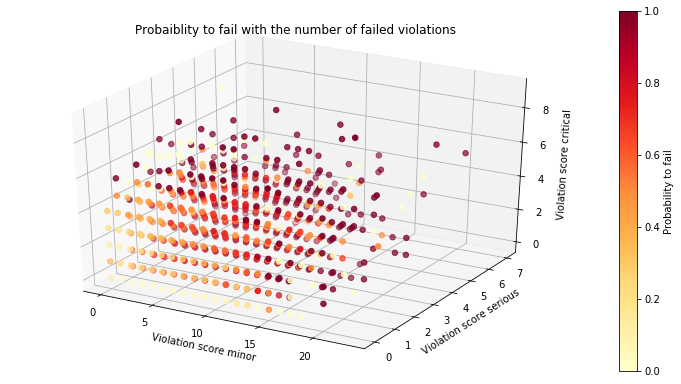

In [163]:
#We create a 3D space representing the score space and we plot  the probability to fail in that space
fig = plt.figure(figsize=(10,5))
ax = Axes3D(fig)

p=ax.scatter3D(violation_score['Violation score minor'], violation_score['Violation score serious'], violation_score['Violation score critical'], c=violation_score['Fail'], cmap='YlOrRd',s=30)

ax.set_xlabel('Violation score minor')
ax.set_ylabel('Violation score serious')
ax.set_zlabel('Violation score critical')
ax.set_title("Probaiblity to fail with the number of failed violations")

fig.colorbar(p,label="Probability to fail")
plt.show()

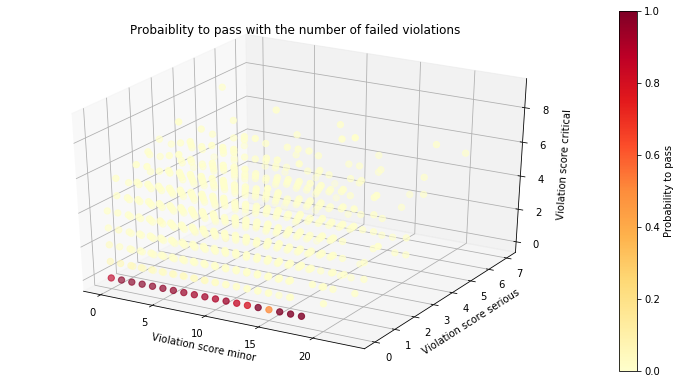

In [164]:
#plotting the probability to pass in the space of the score 
fig = plt.figure(figsize=(10,5))

ax = Axes3D(fig)

p = ax.scatter3D(violation_score['Violation score minor'], violation_score['Violation score serious'], violation_score['Violation score critical'], c=violation_score['Pass'], cmap='YlOrRd',s=40)

ax.set_xlabel('Violation score minor')
ax.set_ylabel('Violation score serious')
ax.set_zlabel('Violation score critical')
ax.set_title("Probaiblity to pass with the number of failed violations")

fig.colorbar(p,label="Probability to pass")

plt.show()

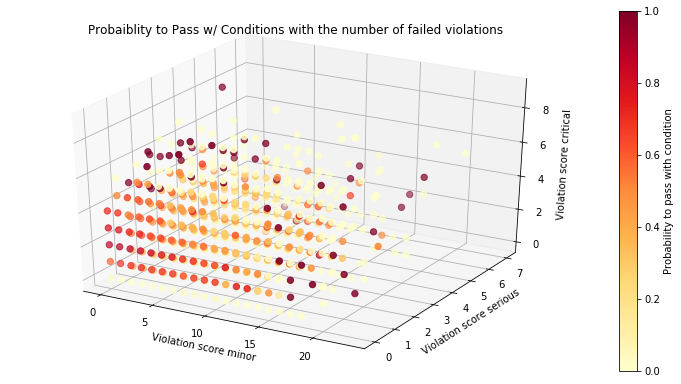

In [165]:
#plotting the probability to pass with condition in the space of the score 
fig = plt.figure(figsize=(10,5))

ax = Axes3D(fig)

p = ax.scatter3D(violation_score['Violation score minor'], violation_score['Violation score serious'], violation_score['Violation score critical'], c=violation_score['Pass w/ Conditions'], cmap='YlOrRd',s=40)

ax.set_xlabel('Violation score minor')
ax.set_ylabel('Violation score serious')
ax.set_zlabel('Violation score critical')
ax.set_title("Probaiblity to Pass w/ Conditions with the number of failed violations")

fig.colorbar(p,label="Probability to pass with condition")
plt.show()

In [46]:
food.groupby('Results')['Violation score minor'].mean()

Results
Fail                  3.941411
Pass                  2.492176
Pass w/ Conditions    3.540392
Name: Violation score minor, dtype: float64

In [47]:
food.groupby('Results')['Violation score serious'].mean()

Results
Fail                  1.156398
Pass                  0.003592
Pass w/ Conditions    0.590140
Name: Violation score serious, dtype: float64

In [48]:
food.groupby('Results')['Violation score critical'].mean()

Results
Fail                  0.719312
Pass                  0.004350
Pass w/ Conditions    1.231335
Name: Violation score critical, dtype: float64

### Facility Type

In [49]:
fvc=food["Facility Type"].value_counts()
fvc[fvc>20].head()

Restaurant                      114651
Grocery Store                    21974
School                           11708
Children's Services Facility      2864
Bakery                            2508
Name: Facility Type, dtype: int64

In [50]:
print("We have {0} other categories for a total number of {1} businesses".format(fvc[fvc<20].shape[0], fvc[fvc<20].sum()))

We have 421 other categories for a total number of 2028 businesses


Might be interesting to set outliers to other

In [51]:
lower_than_20 = fvc[fvc<20].index

food.loc[food["Facility Type"].isin(lower_than_20),"Facility Type"] ="other" 

For the null values in Facility Type, we will just replace them with "Unspecified"

In [52]:
food["Facility Type"].fillna("Unspecified", inplace=True)

Now we can see a proper distribution for the top 10 facilities

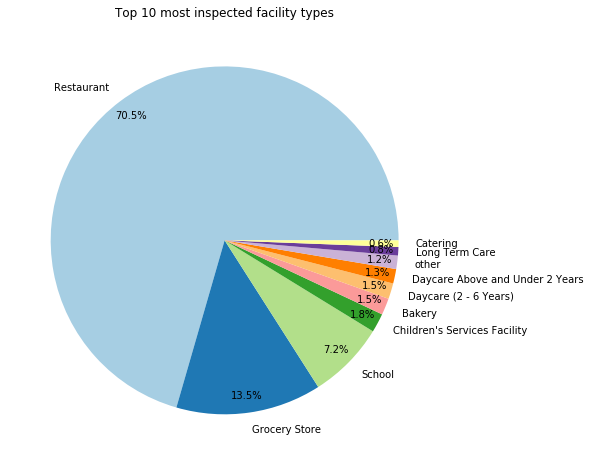

In [53]:
top10_facilities=food["Facility Type"].value_counts().head(10)
fig1, ax1 = plt.subplots(figsize=(8,8))
theme = plt.get_cmap('Paired')
ax1.set_prop_cycle("color", [theme(1. * i / 10)
                             for i in range(10)])
ax1.set_title("Top 10 most inspected facility types")
ax1.pie(top10_facilities.values,labeldistance=1.1, labels=top10_facilities.index, autopct='%1.1f%%',
          pctdistance=0.9, startangle=0)

plt.show()

### Risk

In [54]:
food["Risk"].value_counts()

Risk 1 (High)      125149
Risk 2 (Medium)     32808
Risk 3 (Low)        11976
All                     5
Name: Risk, dtype: int64

5 entries are marked as Risk : ALL . As we don't know the meaning of it and that those entries contain many null values,
We choose to drop these entries

In [55]:
food=food[food["Risk"]!="All"].copy()

In [56]:
food[food["Risk"].isnull()]["Inspection ID"].count()

34

34 entries in Risk are null, since there is no appropiate way to impute them, we choose to drop them

In [57]:
food=food[~food["Risk"].isnull()]

Let's try to understand how risk is distributed

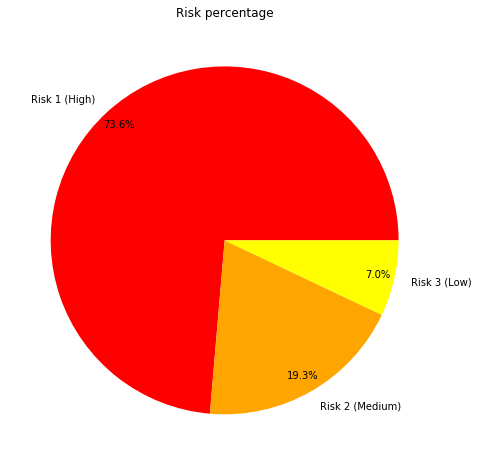

In [58]:
risk_count=food["Risk"].value_counts()
fig, ax = plt.subplots(figsize=(8,8))
ax.set_title("Risk percentage")

ax.pie(risk_count.values,labeldistance=1.1,colors=["red","orange","yellow"], labels=risk_count.index, autopct='%1.1f%%',
          pctdistance=0.9, startangle=0)

plt.show()

Let's see their correlation with the results of inspections

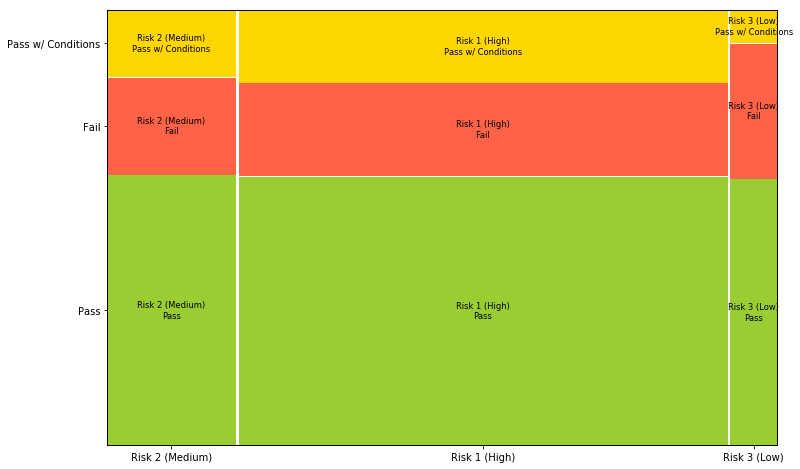

In [59]:
fig, ax = plt.subplots(figsize=(12,8))

props = lambda key: {'color': "yellowgreen" if "Pass" in key else "tomato" if "Fail" in key else "gold"}
mosaic(food,["Risk","Results"], ax=ax ,properties=props)

plt.show()

We see that the pass percentage doesn't really depend on the risk type, although facilities with low risk have slightly more chance to fail

Let's observe the evolution of the risk thought time.

In [60]:
year_inspection_risk = pd.DataFrame(food.groupby(['Year','Risk'])['Inspection ID'].count()).reset_index()

year_inspection_risk = year_inspection_risk.pivot(index='Year', values='Inspection ID', columns='Risk')

year_inspection_risk.fillna(0, inplace=True)

year_inspection_risk

Risk,Risk 1 (High),Risk 2 (Medium),Risk 3 (Low)
Year,,,
2010,11662,3773,1922
2011,11715,4018,1834
2012,11162,3272,1576
2013,12160,3622,1280
2014,13848,3603,1163
2015,13429,3451,1009
2016,15193,3835,831
2017,14420,3200,875
2018,11814,2264,770


Text(0, 0.5, 'Number')

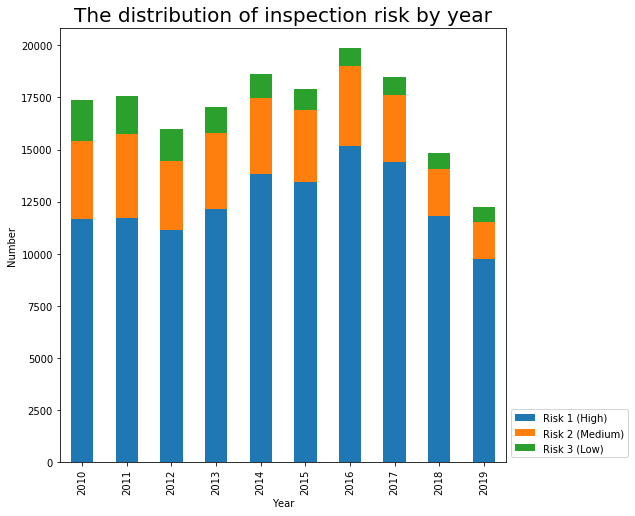

In [61]:
fig, ax = plt.subplots(figsize=(10,10))

year_inspection_risk.plot(kind='bar',stacked=True,figsize=(8,8),ax=ax )

plt.legend(loc="lower left", bbox_to_anchor=(1,0))
ax.set_title("The distribution of inspection risk by year",size=20)
ax.set_xlabel('Year')
ax.set_ylabel('Number')

Text(0, 0.5, 'number')

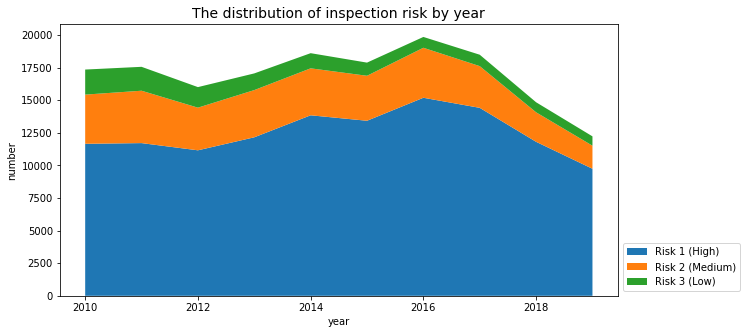

In [166]:
fig, ax = plt.subplots(figsize=(10,5))
                       
plt.stackplot(year_inspection_risk.index, year_inspection_risk['Risk 1 (High)'], year_inspection_risk['Risk 2 (Medium)'], 
              year_inspection_risk['Risk 3 (Low)'])

plt.legend(loc="lower left", bbox_to_anchor=(1,0),labels=year_inspection_risk.columns)
ax.set_title("The distribution of inspection risk by year",size=14)
ax.set_xlabel('year')
ax.set_ylabel('number')

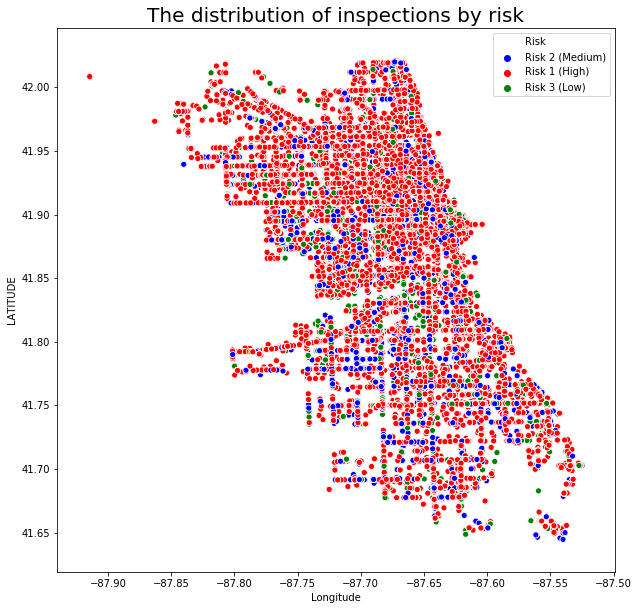

In [176]:
fig, ax = plt.subplots(figsize=(10,10))
sns.scatterplot(x='Longitude', y='Latitude', hue='Risk' , data=food, ax=ax, palette = ["blue","red","green"])
ax.set_title("The distribution of inspections by risk",size=20)
ax.set_xlabel('Longitude')
ax.set_ylabel('LATITUDE')
plt.show()

We can't really see a general pattern let's compute the mean risk per zipcode.

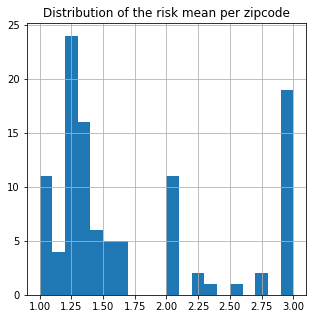

,Zip,Risk mean
0,60007,3.000000
1,60015,3.000000
2,60018,3.000000
3,60022,1.000000
4,60035,3.000000
...,...,...
102,60714,2.000000
103,60803,3.000000
104,60804,3.000000
105,60805,1.666667


In [89]:
food['Risk number'] = food['Risk'].map(lambda x : int(str(x).split(' ')[1]))
mean_risk_zip = food.groupby('Zip').mean()['Risk number']

fig, ax = plt.subplots(figsize=(5,5))
mean_risk_zip.hist(bins=20)
ax.set_title("Distribution of the risk mean per zipcode")
plt.show()

df_risk_zip = pd.DataFrame({'Zip': mean_risk_zip.index.astype(int).astype(str), 'Risk mean' :mean_risk_zip.values} )
df_risk_zip

We draw the results on the map using GeoJson zipcode file.

In [91]:
with open("data/Boundaries-ZIP-Codes.geojson") as json_file:
    zipcodes = json.load(json_file)
    
m = folium.Map(location=[41.85003,-87.6], tiles='cartodbpositron', zoom_start=10.3)

folium.GeoJson(zipcodes).add_to(m)
m.save("initial_zip.html")
m

This is the map of chicago divided by zipcode

In [99]:
m1 = folium.Map(location=[41.85003,-87.6], tiles='cartodbpositron', zoom_start=10.3)

folium.Choropleth(
    geo_data=zipcodes,
    data=df_risk_zip,
    columns=['Zip', 'Risk mean'],
    key_on='feature.properties.zip',
    fill_color='RdYlBu',
    highlight=True,
    fill_opacity=0.7,
    legend_name="Risk Mean",
    show=False,
).add_to(m1)

m1.save("zip_risk_mean.html")
m1

We now look at the proportion of fail, pass and pass wtih condition per zip code. 

In [100]:
food.Results.value_counts()

Pass                  105498
Fail                   37659
Pass w/ Conditions     26775
Name: Results, dtype: int64

In [101]:
food.groupby('Zip').Results.count().sort_values(ascending = False)

Zip
60614.0    6166
60647.0    5922
60657.0    5713
60611.0    5623
60622.0    5327
           ... 
60189.0       1
60477.0       1
60464.0       1
60202.0       1
60453.0       1
Name: Results, Length: 107, dtype: int64

In [102]:
# we group by zip and count the number of fail/pass that we normalize after
dist_zip = food.groupby('Zip').Results.value_counts().unstack().reset_index().fillna(0)

# We sum up the groups

sums = dist_zip.loc[:, ['Fail','Pass','Pass w/ Conditions']].sum(axis=1).values.reshape((-1,1))
# We normalize them

dist_zip.loc[:,['Fail','Pass','Pass w/ Conditions']]= dist_zip.loc[:,['Fail','Pass','Pass w/ Conditions']] /sums

# We count the number of samples to have an idea about the significance of our statistics
dist_zip['# of samples'] = food.groupby('Zip').Results.count().values
dist_zip.Zip = dist_zip.Zip.map(lambda x : str(int(x)) ) 
dist_zip.sort_values(ascending = False , by= "# of samples")

Results,Zip,Fail,Pass,Pass w/ Conditions,# of samples
55,60614,0.226078,0.568602,0.205319,6166
87,60647,0.241810,0.600304,0.157886,5922
95,60657,0.222825,0.593559,0.183616,5713
52,60611,0.165926,0.649475,0.184599,5623
63,60622,0.237094,0.615919,0.146987,5327
...,...,...,...,...,...
14,60148,0.000000,1.000000,0.000000,1
29,60438,0.000000,1.000000,0.000000,1
16,60155,0.000000,1.000000,0.000000,1
27,60423,0.000000,1.000000,0.000000,1


In [103]:
m2 = folium.Map(location=[41.85003,-87.6], tiles='cartodbpositron', zoom_start=10.3)

folium.Choropleth(
    geo_data=zipcodes,
    data=dist_zip,
    columns=['Zip', 'Fail'],
    key_on='feature.properties.zip',
    fill_color='Reds',
    highlight=True,
    fill_opacity=0.7,
    legend_name="Fail probability",
    show=False,
).add_to(m2)

m2.save("zip_fail.html")
m2

In [105]:
m3 = folium.Map(location=[41.85003,-87.6], tiles='cartodbpositron', zoom_start=10.3)

folium.Choropleth(
    geo_data=zipcodes,
    data=dist_zip,
    columns=['Zip', 'Pass'],
    key_on='feature.properties.zip',
    fill_color='RdYlGn',
    highlight=True,
    fill_opacity=0.7,
    legend_name="Pass probability",
    show=False,
).add_to(m3)

m3.save("zip_pass.html")
m3

In [107]:
m4 = folium.Map(location=[41.85003,-87.6], tiles='cartodbpositron', zoom_start=10.3)

folium.Choropleth(
    geo_data=zipcodes,
    data=dist_zip,
    columns=['Zip', 'Pass w/ Conditions'],
    key_on='feature.properties.zip',
    fill_color='Blues',
    highlight=True,
    fill_opacity=0.7,
    legend_name="Pass with conditions probability",
    show=False,
).add_to(m4)

m4.save("zip_pass_conditions.html")
m4

### Inspection type

There only is one nul value for Inspection type, we drop it

In [83]:
food = food[~food["Inspection Type"].isnull()]

An inspection can be one of the following types: 
    
    -canvass, the mostcommon type of inspection performed at a frequency relative to the risk of the establishment;
    
    -consultation, when the inspection is done at the request of the owner prior to the opening of the establishment; 
    
    -complaint, when the inspection is done in response to a complaint against the establishment;
    
    -license, when the inspection is done as a requirement for the establishment to receive its license to operate;
    
    -suspect food poisoning, when the inspection is done in response to one or more persons claiming to have gotten ill as a result of eating at the establishment (a specific type of complaint-based inspection);

    -task-force inspection, when an inspection of a bar or tavern is done.

Re-inspections can occur for most types of these inspections and are indicated as such. 


In [84]:
food["Inspection Type"].nunique()

102

We observe that we have several inspection's types representing the same thing and thus we can regroup them.

In [85]:
food["Inspection Type exact"] = food["Inspection Type"].copy()

In [109]:
# Hardocde grouping of inspection types
food["Inspection Type"] = food["Inspection Type"].map(lambda x: x.lower())
food["Inspection Type"] = food["Inspection Type"].map(lambda x: re.sub('re-', 're', x))
food["Inspection Type"] = food["Inspection Type"].map(lambda x:'reinspection' if ('reinspection' in x ) else x)
food["Inspection Type"] = food["Inspection Type"].map(lambda x:'food poisoning' if ('sfp' in x or 'fbi' in x or 'sick' in x or 'poisoning' in x ) else x)
food["Inspection Type"] = food["Inspection Type"].map(lambda x:'canvass' if ('canvas' in x ) else x)
food["Inspection Type"] = food["Inspection Type"].map(lambda x:'complaint' if ('complaint' in x ) else x)
food["Inspection Type"] = food["Inspection Type"].map(lambda x:'license' if ('license' in x ) else x)
food["Inspection Type"] = food["Inspection Type"].map(lambda x:'task force' if ('task' in x ) else x)

Staphylococcal food poisoning (SFP) is one of the most common food-borne diseases worldwide.

The FBI or Fungus, Bacteria, and Invertebrates are decomposers.

In [110]:
food["Inspection Type"].nunique()

36

In [111]:
kept = ["canvass", "reinspection", "license", "complaint", "suspected food poisoning", "consultation", "tag removal", "recent inspection", "out of business", "task force", "food poisoning"] 

food["Inspection Type"] = food["Inspection Type"].map(lambda x: x if (x in kept ) else 'other')


Now let's see their distribution

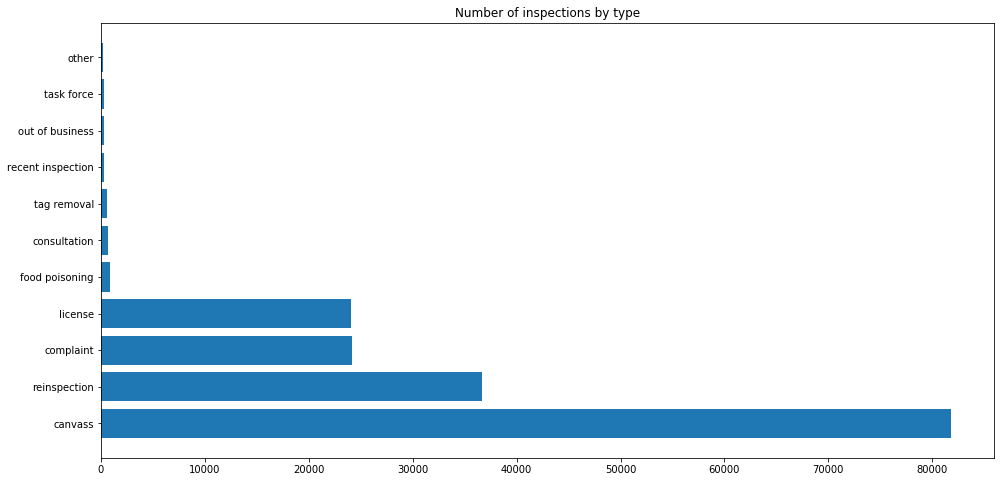

In [112]:
inspection_count=food["Inspection Type"].value_counts()
fig ,ax=plt.subplots(figsize=(16,8))
ax.set_title("Number of inspections by type")
_=ax.barh(inspection_count.index,inspection_count.values)

In [113]:
# We count the number pf inspections by type and year
year_inspection_type = pd.DataFrame(food.groupby(['Year','Inspection Type'])['Inspection ID'].count()).reset_index()

year_inspection_type = year_inspection_type.pivot(index='Year', values='Inspection ID', columns='Inspection Type')

year_inspection_type.fillna(0, inplace=True)

year_inspection_type.head()

Inspection Type,canvass,complaint,consultation,food poisoning,license,other,out of business,recent inspection,reinspection,tag removal,task force
Year,,,,,,,,,,,
2010,7006.0,2920.0,236.0,233.0,2705.0,149.0,285.0,22.0,3437.0,258.0,106.0
2011,7548.0,2880.0,136.0,145.0,2642.0,40.0,1.0,20.0,3680.0,331.0,144.0
2012,6845.0,2743.0,74.0,101.0,2742.0,14.0,0.0,2.0,3462.0,6.0,21.0
2013,8834.0,2198.0,60.0,52.0,2554.0,4.0,0.0,12.0,3344.0,3.0,1.0
2014,10106.0,2261.0,71.0,44.0,2375.0,4.0,0.0,31.0,3720.0,2.0,0.0


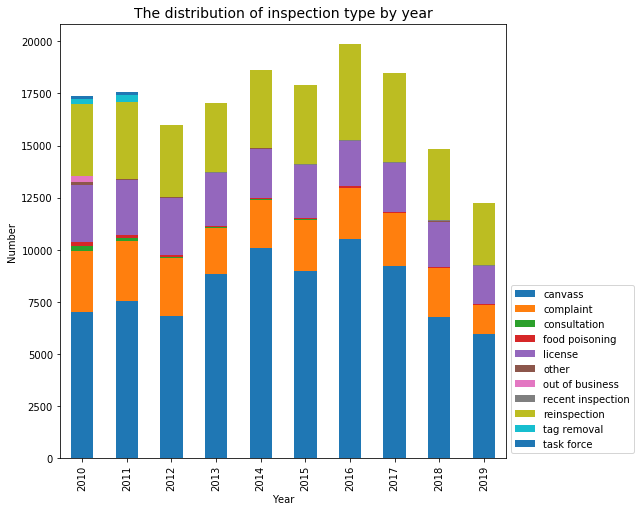

In [114]:
fig, ax = plt.subplots(figsize=(10,10))

year_inspection_type.plot(kind='bar',stacked=True,figsize=(8,8),ax=ax )

plt.legend(loc="lower left", bbox_to_anchor=(1,0))
ax.set_title("The distribution of inspection type by year",size=14)
ax.set_xlabel('Year')
ax.set_ylabel('Number')

plt.show()

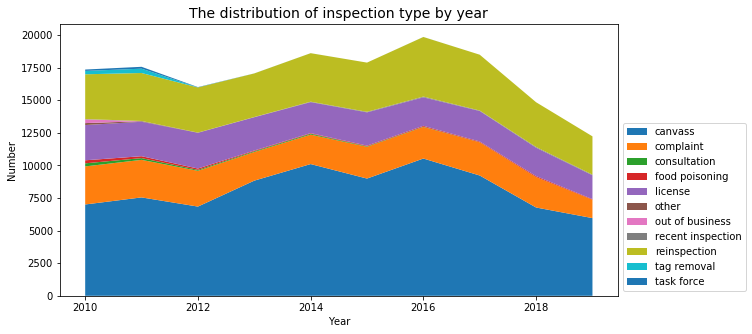

In [115]:
fig, ax = plt.subplots(figsize=(10,5))
                       
plt.stackplot(year_inspection_type.index, year_inspection_type['canvass'], year_inspection_type['complaint'], 
              year_inspection_type['consultation'], year_inspection_type['food poisoning'], year_inspection_type['license'],
              year_inspection_type['other'], year_inspection_type['out of business'], year_inspection_type['recent inspection'], 
              year_inspection_type['reinspection'], year_inspection_type['tag removal'], year_inspection_type['task force'],)

plt.legend(loc="lower left", bbox_to_anchor=(1,0),labels=year_inspection_type.columns)
ax.set_title("The distribution of inspection type by year",size=14)
ax.set_xlabel('Year')
ax.set_ylabel('Number')

plt.show()

We want to focus more on the food poisoning cases: 

#### Food Poisoning

Text(0, 0.5, 'LATITUDE')

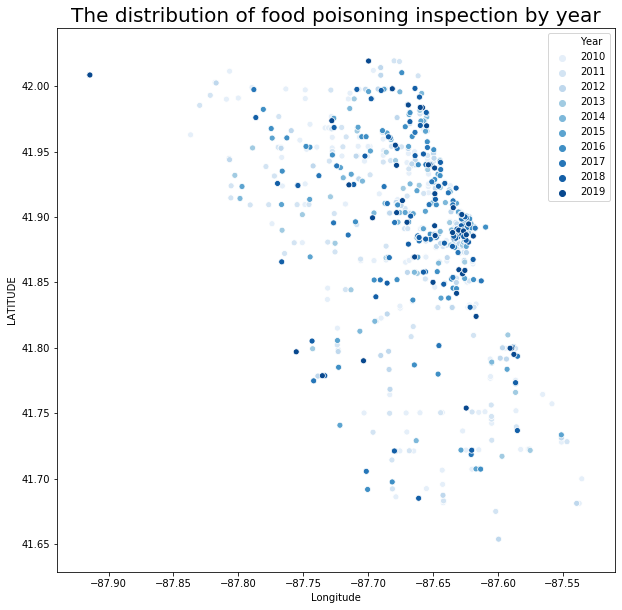

In [178]:
food_poisoning_cases= food[food['Inspection Type'] == 'food poisoning']
fig, ax = plt.subplots(figsize=(10,10))
sns.scatterplot(x='Longitude', y='Latitude', hue='Year' , data=food_poisoning_cases,palette=sns.color_palette("Blues",10),ax=ax)
ax.set_title("The distribution of food poisoning inspection by year",size=20)
ax.set_xlabel('Longitude')
ax.set_ylabel('LATITUDE')

Text(0, 0.5, '# food poisoning')

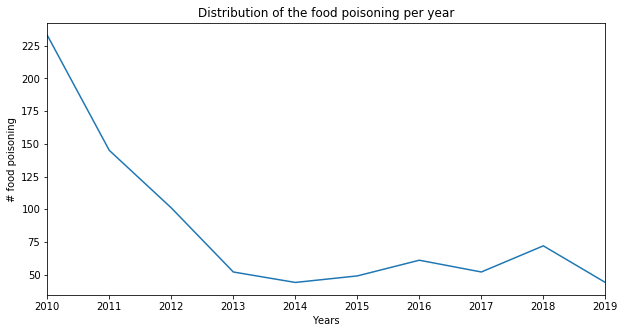

In [117]:
year_inspection_type['food poisoning'].plot(figsize=(10,5))
plt.title("Distribution of the food poisoning per year")
plt.xlabel("Years")
plt.ylabel("# food poisoning")

The number of inspections for food poisoning is interesting and give us some informations.
Indeed, from 2010 to 2014 we observe that while the total number of food inspections increases by a factor of 1.2, 
there is a net decrease (by a factor of 5) of the food poisoning inspections. 

So what did change, several hypohtesis are possible : 
    
    -H0: The detection algorithm improved so that from the number of inspections needed is smaller
    -H1: The inspection had a direct effect and the bad restaurants were closed 

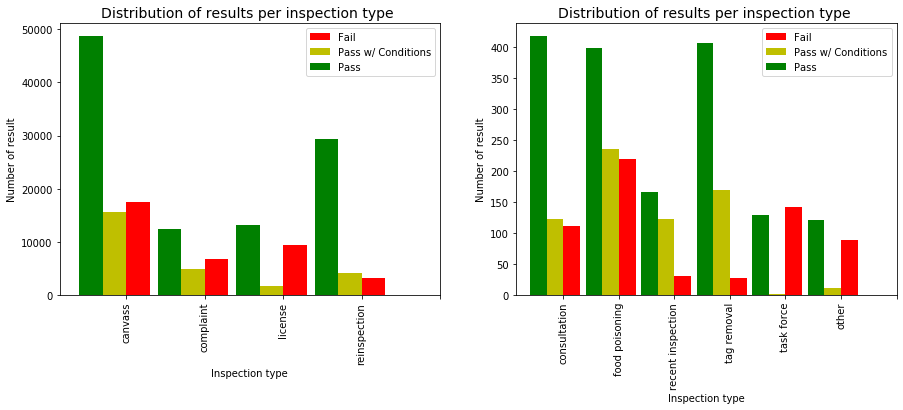

In [180]:
food['Fail'] = food['Results'] == "Fail"
food['Pass'] = food['Results'] == "Pass"
food['Pass w/ Conditions'] =  food['Results'] == "Pass w/ Conditions"

fig = plt.figure(figsize=(15,5))

ax1 = fig.add_subplot(121) 
ax2 = fig.add_subplot(122) 

failures = food.groupby("Inspection Type").sum()['Fail'].copy()
successes = food.groupby("Inspection Type").sum()['Pass'].copy()
condtions = food.groupby("Inspection Type").sum()['Pass w/ Conditions'].copy()

group1 = ['canvass', 'complaint', 'license', 'reinspection','']
group2 = ['consultation' ,'food poisoning', 'recent inspection', 'tag removal', 'task force','other','']

failures[group1].plot(kind ='bar',ax=ax1, color='r',position=0,width=0.3,legend=True)
condtions[group1].plot(kind ='bar', ax=ax1, color='y',position=1,width=0.3,legend=True)
successes[group1].plot(kind ='bar', ax=ax1, color='g',position=2,width=0.3,legend=True)

ax1.set_title("Distribution of results per inspection type ",size=14)
ax1.set_xlabel('Inspection type')
ax1.set_ylabel('Number of result')

failures[group2].plot(kind ='bar',ax=ax2, color='r',position=0,width=0.3,legend=True)
condtions[group2].plot(kind ='bar', ax=ax2, color='y',position=1,width=0.3,legend=True)
successes[group2].plot(kind ='bar', ax=ax2, color='g',position=2,width=0.3,legend=True)

ax2.set_title("Distribution of results per inspection type ",size=14)
ax2.set_xlabel('Inspection type')
ax2.set_ylabel('Number of result')

plt.show()

We are intersted in how food poisoning evolve through time.

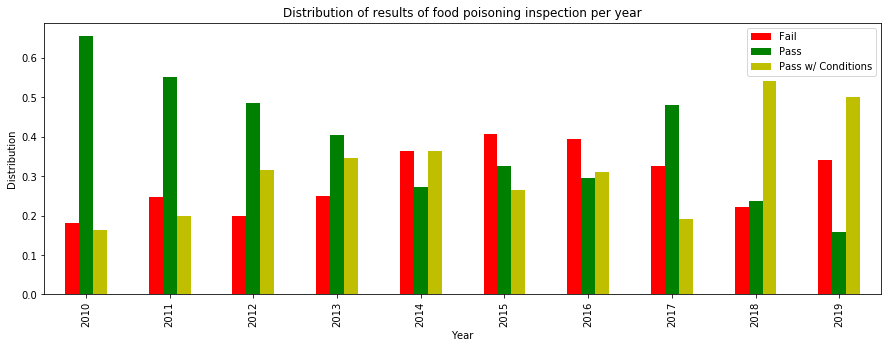

In [119]:
food_poisoning= food[food['Inspection Type'] == 'food poisoning']
categories_food_poisonning= food_poisoning.groupby('Year').sum()[['Fail', 'Pass' , 'Pass w/ Conditions']]
total_numbers= categories_food_poisonning.sum(axis=1)
categories_food_poisonning_norm = categories_food_poisonning/total_numbers.values.reshape((-1,1))

categories_food_poisonning_norm.plot(kind='bar', color= ('r','g', 'y'), figsize = (15,5))
plt.title("Distribution of results of food poisoning inspection per year")
plt.ylabel("Distribution")

plt.show()

### Adress

In [120]:
food["Address"]=food["Address"].str.strip()

### Names

The null values in AKA Name can be replaced with their correspending BDA name

In [121]:
food.loc[food["AKA Name"].isnull(),"AKA Name"] = food.loc[food["AKA Name"].isnull(),"DBA Name"]

In [122]:
# casefold
food["DBA Name"]=food["DBA Name"].str.casefold()
food["AKA Name"]=food["AKA Name"].str.casefold()
# remove anything within paranthesis
food["AKA Name"]=food["AKA Name"].apply(lambda x: re.sub(r'\([^)]*\)', '', x ))
# Let's inspect joint businesses, these have a "/" in their AKA Name
joint=food[["/" in aka for aka in food["AKA Name"]]]["AKA Name"].unique()
joint[0:20]

array(['dunkin donuts/baskin-robbins', 'jewel / osco',
       'south side fuel ctr/dunkin doughnuts',
       'dunkin donuts / baskin robbins', 'catering/main kitchen',
       'dunkin donuts / baskin robins', 'montessori acdy. inft/tod. cnt',
       'cvs/pharmacy #2981', 'kfc/long john silver', 'mayne/act one',
       'italian village / vivere', 'mayne stage/act one cafe',
       'northwest middle/belmont-cragin',
       'collins academy/north lawndale college prep',
       'legno/suparossa carry out', 'am/pm',
       'dunkin  donuts / baskin robbins', 'solo cup co./aramark services',
       'pink monkey / new york strip', "kmart/little caesar's"],
      dtype=object)

In [123]:
# Lots of them are in the form "cvs/pharmacy #xxxxx" so we can fix this 
cvs=food[[aka.startswith("cvs") for aka in food["AKA Name"]]]["AKA Name"].index
food.loc[cvs,"AKA Name"]="cvs"

Let's check if we still have nan values:

In [124]:
null_cols=np.sum(food.isnull() , axis=0)
null_cols[null_cols>0]

Series([], dtype: int64)

## Informed Plan

### Food Chain investigation

**Are food chains in different areas more prone to food inspections failure than the same food chains in other areas ?**

To answer this question, we will analyze the geoographical distribution of risk, types of inspection, inpection result and violation type.
We have shown that this is possible to do as we did it for the entire data and we want to do this now for the specific case of food chains in order to conclude whether these characteristics change depending on location within the same food chain. 

### Chicago Tribune article

**Can we assess how real Chicago Tribune's critics are ?**

To answer this question, first we will seperate the establishments by risk category and then we will observe the frequency of inspections and how the inspection's result impact the next inspection.Secondly, we will look at whether there has been a notable change in the inspection behavior past the article publication's date.
The article asks an important question "Does Chicago need more inspectors or more realisitc rules ?". Therefore, we will try to answer this question by comparing the impact of the frequency of the previous investigation and the previous violation assigned on the next result.
For the inspections' frequency we can see by how much the probabilty of a complaint or food poisonning investigation changes with the time interval between inspections.
For the "rules" criteria we can look at the most commun reported violations in passed inspections before a business fails and assess how critical their impact is.

### Yelp's reviews 

### Food chains

In [125]:
food[food["DBA Name"]=="subway"]["AKA Name"].unique()

array(['subway'], dtype=object)

In [126]:
food[food["AKA Name"]=="subway"]["DBA Name"].unique()

array(['subway', 'subway sandwiches and salads', 'subway store  # 25458',
       'subway sandwiches & salads', 'subway  5183', 'subway 14641',
       'the great state fare', 'c-k subway', 'subway 26199',
       'subway-sandwich', 'subway #44541', 'subway sandwich & salads',
       'sub way', 'sandwich & salad', 'subway sandwiches',
       'subway sandwich shop', 'subway restaurant',
       'subway sandwich & salad', 'subway # 26817-309 w. monroe',
       'subway / tcby', 'subway 7709', 'subway 1121', 'subway #25073',
       'subway 3634', 'subway store #30969', 'subway sandwich and salads',
       'subway 10266', 'skyhigh-101', 'subway sanwich shop',
       'subway #51581', 'subway  #38326', 'subway subs and salads',
       'subway sandwiches and salad', 'subway 50886',
       'subway sandwiches & salad', 'subway restaurant #35406',
       'subway 25064', 'lincoln ave subway', 'subway 275',
       'subway at norwegian american hospital', 'subway #4267',
       'subway sandwich', 'subwa

In [127]:
food[food["AKA Name"]=="mcdonalds"]["DBA Name"].unique()

array(['mcdonalds', 'mcdonalds restaurant', 'pma mcd inc', "mcdonald's",
       'mcdonalds restaurant # 14173', "hale family mcdonald's",
       'mcdonalds #335'], dtype=object)

In [128]:
food[food["DBA Name"]=="mcdonalds"]["AKA Name"].unique()

array(['mcdonalds', 'mc donalds', "mcdonald's", 'mcdonalds  '],
      dtype=object)

From these examples we can see that it is easier to identify food chains' establishments by their AKA Name

In [129]:
# remove punctuation
food["DBA Name"]=food["DBA Name"].str.replace(r'[^\w\s]+', '')
food["AKA Name"]=food["AKA Name"].str.replace(r'[^\w\s]+', '')
# One of our goals is to investigate food chains, so we'll try to group them according to their AKA Name
# Hardcode formatting for food chains
food["AKA Name"]=food["AKA Name"].str.replace("kentucky fried chicken", 'kfc')
food["AKA Name"]=food["AKA Name"].str.replace("mc donalds","mcdonalds")
food["AKA Name"]=food["AKA Name"].str.replace("mcdonalds restaurant","mcdonalds")
food["AKA Name"]=food["AKA Name"].str.replace("dominos pizza","dominos")
food["AKA Name"]=food["AKA Name"].str.replace("subway sandwiches","subway")
food["AKA Name"]=food["AKA Name"].str.replace("chipotle mexican grill","chipotle")
food["AKA Name"]=food["AKA Name"].str.replace("potbelly sandwich works", "potbelly")
food["AKA Name"]=food["AKA Name"].str.replace("potbelly sandwich works llc", "potbelly")
food["AKA Name"]=food["AKA Name"].str.replace("whole foods market","whole foods")
food["AKA Name"]=food["AKA Name"].str.replace("7eleven","7 eleven")
food["AKA Name"]=food["AKA Name"].str.replace("j  j fish","jj fish  chicken")
food["AKA Name"]=food["AKA Name"].str.replace("quiznos sub","quiznos")
food["AKA Name"]=food["AKA Name"].str.replace("starbucks coffee","starbucks")
food["AKA Name"]=food["AKA Name"].str.replace("donutsbaskin","donuts baskin")


food["AKA Name"]=food["AKA Name"].str.title()
food["AKA Name"]=food["AKA Name"].str.replace(" ","")
food["DBA Name"]=food["DBA Name"].str.strip()

We can't talk about food in Chicago without mentionning their deep dish pizza, and namely two of their most famous venues: **Giordano's** and **Lou Malnati's** . So let's add them

In [130]:
food[["Malnati" in aka for aka in food["AKA Name"]]]["AKA Name"].unique()


array(['LouMalnatisPizzeria', 'LouMalnatis'], dtype=object)

In [131]:
food["AKA Name"]=food["AKA Name"].str.replace('LouMalnatisPizzeria', 'LouMalnatis')

In [132]:
giordanos=food[["Giordano" in aka for aka in food["AKA Name"]]].index
food.loc[giordanos,"AKA Name"]="Giordanos"

In [133]:
# We look at establishments with the same AKA name and different adresses
food_chains=food.groupby("AKA Name").Address.nunique().sort_values(ascending=False)
# We will retain food chains with 10 or more establishments
food_chains=food_chains[food_chains>10]
#food_chains[food_chains<10].head(20)
food_chains

AKA Name
Subway                       280
DunkinDonuts                 159
7Eleven                      110
Mcdonalds                    108
Starbucks                    101
Citgo                         72
Cvs                           69
DunkinDonutsBaskinRobbins     69
Walgreens                     42
JimmyJohns                    42
BurgerKing                    42
Marathon                      41
Bp                            34
DollarTree                    33
Chipotle                      33
Kfc                           31
GatewayNewstand               31
Dominos                       30
FamilyDollar                  29
Potbelly                      26
Wendys                        26
PizzaHut                      26
HaroldsChicken                26
TacoBell                      26
Freshii                       23
Wingstop                      22
AuBonPain                     21
Shell                         21
Giordanos                     21
JjFishChicken                 21
H

In [134]:
from sklearn.metrics.pairwise import euclidean_distances
# We are interested in food chains that are rather spread out across the city, for that we will assess the pairwise
# distances of establishments within the same food chain
def food_chain_spread(food_chain):
    location=food[food["AKA Name"]==food_chain][["Latitude","Longitude"]]
    dist_mat=euclidean_distances(location,location)
    return np.sum(dist_mat)/(len(location))
food_chain_spread("Subway")

436.22815124500346

In [135]:
spread=pd.Series(food_chains.index).apply(lambda x: food_chain_spread(x))

In [136]:
fc=pd.DataFrame({"Food_chain":food_chains.index,"number_of_establishments":food_chains.values,"spread":spread})

In [137]:
fc.sort_values("spread", ascending=False).head(10)

,Food_chain,number_of_establishments,spread
0,Subway,280,436.228151
3,Mcdonalds,108,282.205929
1,DunkinDonuts,159,156.132113
2,7Eleven,110,100.732759
4,Starbucks,101,99.936245
7,DunkinDonutsBaskinRobbins,69,84.836581
10,BurgerKing,42,50.560232
20,Wendys,26,45.364857
15,Kfc,31,44.239157
14,Chipotle,33,40.600311


Unsuprisingly, fast food chains dominate the list